In [71]:
%load_ext autoreload
%autoreload 2
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:96% !important; }</style>"))

import os
import torch
import matplotlib.pyplot as plt
from skimage.io import imread
import torch.nn as nn
import numpy as np
from skimage import img_as_ubyte
import imageio
import json
import cv2
import time
from PIL import Image
from pytorch3d.loss import (
    mesh_laplacian_smoothing, 
    mesh_normal_consistency,
)
from torch.optim.lr_scheduler import ReduceLROnPlateau

import torch.nn.functional as F

from tqdm import tqdm_notebook
# Util function for loading meshes
from pytorch3d.io import load_objs_as_meshes, load_obj
import math
# Data structures and functions for rendering
from pytorch3d.structures import Meshes, Textures, join_meshes_as_batch
from pytorch3d.renderer import (
    look_at_view_transform,
    OpenGLPerspectiveCameras, 
    SfMPerspectiveCameras,
    SfMOrthographicCameras,
    PointLights, 
    BlendParams,
    DirectionalLights,
    Materials, 
    RasterizationSettings, 
    MeshRenderer, 
    MeshRasterizer,  
    TexturedSoftPhongShader,
    SoftSilhouetteShader,
    look_at_rotation,
    HardFlatShader
)

# add path for demo utils functions 
import sys
import os
import glob
sys.path.append(os.path.abspath(''))

print(torch.version.cuda)
from datetime import datetime
def now_str():
    now = datetime.now()
    month = str(now.month)
    day = str(now.day)
    hour = str(now.hour)
    minute = str(now.minute)
    sec = str(now.second)
    
    output = '[{:>02}/{:>02} {:>02}:{:>02}:{:>02}]'.format(month, day, hour, minute, sec)
    return output
def __output_log(path, strs):
    if not os.path.exists(path):
        with open(path, 'w+') as f:
            f.write(strs)
            f.close()
    else:
        with open(path, 'a+') as f:
            f.write(strs)
            f.close()
print(now_str())
print(torch.__version__)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


9.2
[05/09 16:23:42]
1.4.0


In [72]:
in_dir = './14b_data/output'
img_names = ['03052', '03990', '04917', '06950']
cam_indices = list(range(16))

In [73]:
tex_counts = {}
tex_sums = {}
tex_average = {}
for img_name in img_names:
    tex_count = np.zeros((1024, 1024)).astype(np.uint8)
    tex_sum = np.zeros((1024, 1024)).astype(np.float32)
    for cam_idx in cam_indices:
        in_path = in_dir + '/{}/{}/texturemap.npy'.format(img_name, cam_idx)
        tex_np = np.load(in_path).squeeze()
        tex_count = tex_count + np.where(tex_np > 0.0, 1, 0)
        tex_sum = tex_sum + np.where(tex_np > 0.0, tex_np, 0)
    tex_counts[img_name] = tex_count
    tex_sums[img_name] = tex_sum
    tex_avg = tex_sum / np.where(tex_count > 0, tex_count, 1)
    tex_average[img_name] = tex_avg

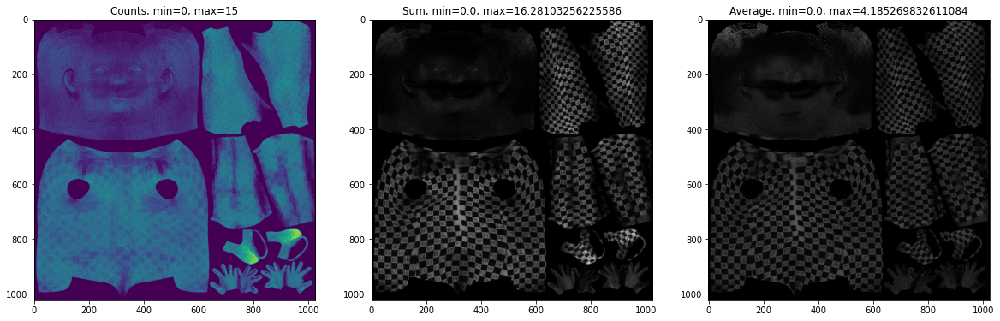

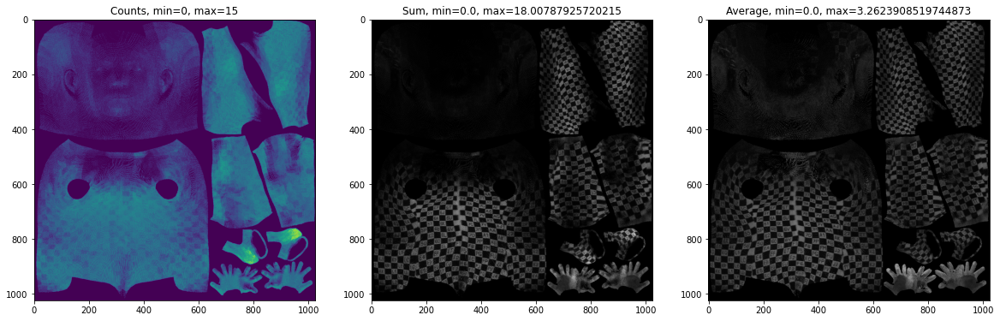

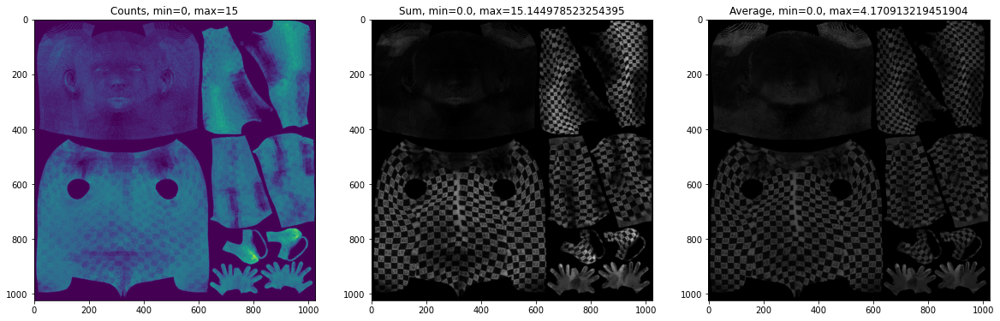

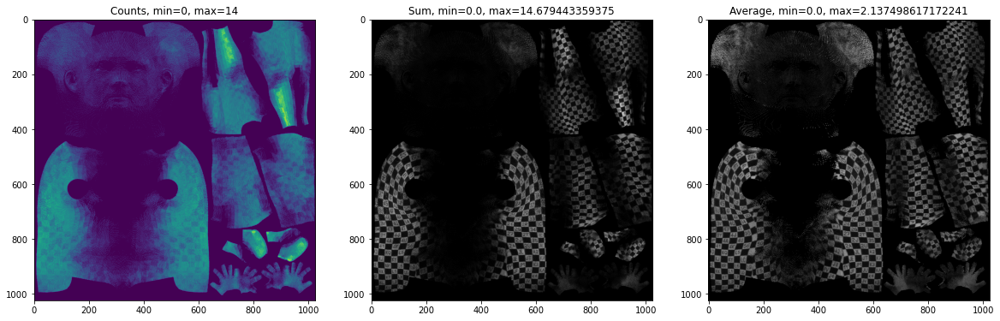

In [53]:
for img_name, tex_c in tex_counts.items():
    fig, ax = plt.subplots(1,3,figsize=(20, 10))
    ax[0].set_title('Counts, min={}, max={}'.format(np.min(tex_c), np.max(tex_c)))
    ax[0].imshow(tex_c)
    
    tex_s = tex_sums[img_name]
    ax[1].imshow(tex_s, cmap='gray')
    ax[1].set_title('Sum, min={}, max={}'.format(np.min(tex_s), np.max(tex_s)))
    
    tex_a = tex_average[img_name]
    ax[2].imshow(tex_a, cmap='gray')
    ax[2].set_title('Average, min={}, max={}'.format(np.min(tex_a), np.max(tex_a)))
    plt.show()

In [68]:
texturemap_count = np.zeros((1024, 1024)).astype(np.int32)
texturemap_avg = np.zeros((1024, 1024)).astype(np.float32)
for img_name, tex_c in tex_counts.items():
    tex_s = tex_sums[img_name]
    texturemap_avg += np.where(tex_s > 0.0, tex_s, 0)
    texturemap_count += tex_c
#texturemap_avg = np.where(texturemap_avg > 0.0, texturemap_avg, 1.0) / np.where(texturemap_count > 0, texturemap_count, 1)
texturemap_avg = texturemap_avg / np.where(texturemap_count > 0, texturemap_count, 1)
texturemap_avg = np.clip(texturemap_avg, a_min=0, a_max=1)

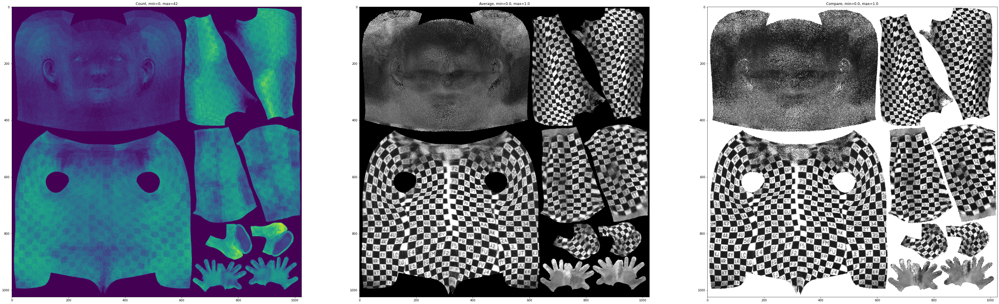

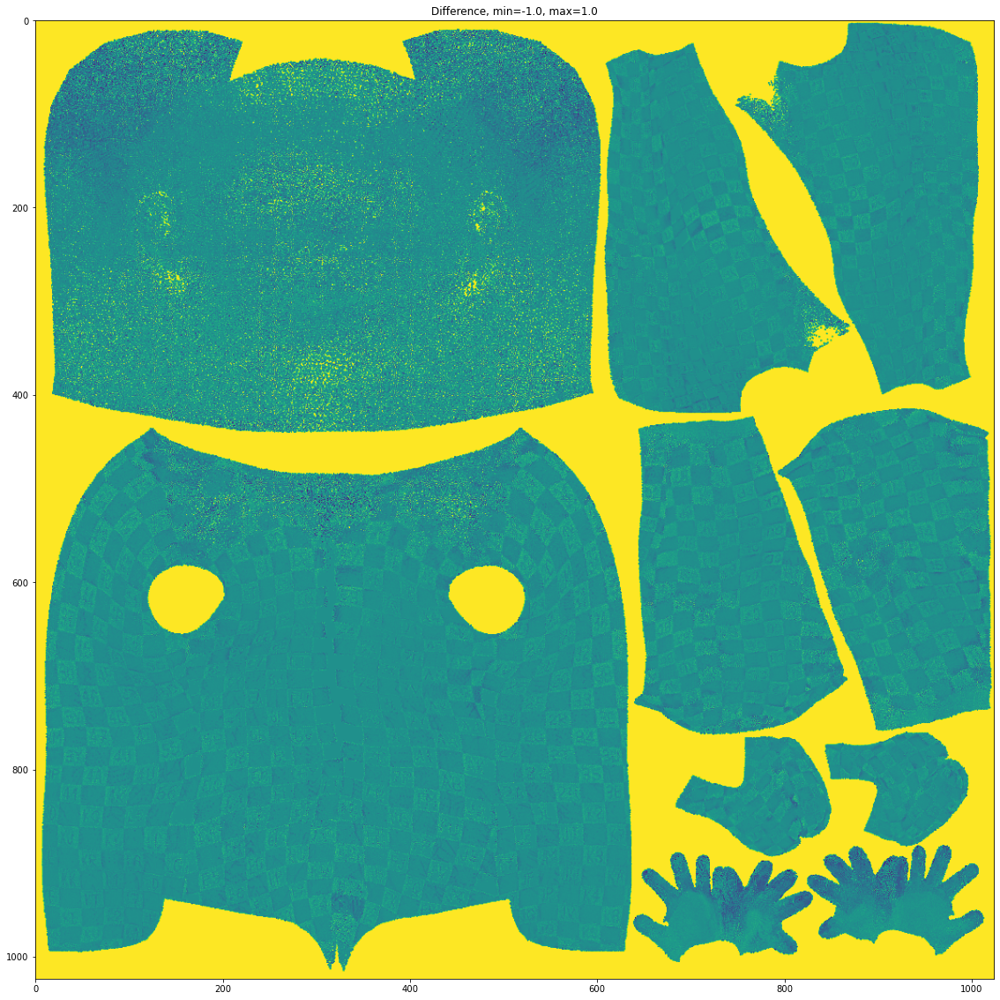

In [69]:
tex_comparison = np.load(r'D:\1_Projects\200325_PyTorch3d_Toy\9_data\output\200413_SingleVsMulti\multi_L1\texturemap.npy').squeeze()
tex_comparison = cv2.resize(tex_comparison, (1024, 1024))
tex_comparison = np.clip(tex_comparison, a_min=0, a_max=1)

fig, ax = plt.subplots(1, 3, figsize=(60, 20))
ax[0].imshow(texturemap_count)
ax[0].set_title('Count, min={}, max={}'.format(np.min(texturemap_count), np.max(texturemap_count)))

ax[1].set_title('Average, min={}, max={}'.format(np.min(texturemap_avg), np.max(texturemap_avg)))
ax[1].imshow(texturemap_avg, cmap='gray', vmin=np.min(texturemap_avg), vmax=np.max(texturemap_avg))

ax[2].set_title('Compare, min={}, max={}'.format(np.min(tex_comparison), np.max(tex_comparison)))
ax[2].imshow(tex_comparison, cmap='gray', vmin=np.min(tex_comparison), vmax=np.max(tex_comparison))

plt.show()

diff= tex_comparison - texturemap_avg
plt.figure(figsize=(20, 20))
plt.imshow(diff)
plt.title('Difference, min={}, max={}'.format(np.min(diff), np.max(diff)))
plt.show()

In [70]:
save_path = r'D:\1_Projects\200325_PyTorch3d_Toy\14b_data\output\texturemap_averaged.png'
texturemap_out = (255.0*texturemap_avg).astype(np.uint8)
im = Image.fromarray(texturemap_out)
im.save(save_dir, dpi=(600, 600))
print('saved:', save_dir)

saved: D:\1_Projects\200325_PyTorch3d_Toy\14b_data\output\texturemap_averaged.png


In [74]:
save_path = r'D:\1_Projects\200325_PyTorch3d_Toy\14b_data\output\texturemap_averaged.npy'
np.save(save_path, texturemap_avg)
print('saved:', save_path)

saved: D:\1_Projects\200325_PyTorch3d_Toy\14b_data\output\texturemap_averaged.npy
